In [5]:
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt

# Data

In [6]:
data = pd.read_csv('full_data_clustered_ssim_V4.csv')
data = data.replace(np.nan,'None')
data = data.drop(columns=['cluster','cluster_2'])
print(data.shape)

df = data.copy()
df = df[df['Authentication']!='Single system']
df = df[df['Access']!='Unknown']
df = df.reset_index().drop(columns=['level_0'])
print(df.shape)

#after features selection
cols = ['Access','Complexity','Authentication','Conf.','Integ.','Avail']
numerical_cols = ['Score','Number Of Related Vulnerabilities']

from sklearn.preprocessing import MinMaxScaler , StandardScaler
mnScaler = MinMaxScaler()
mn_scaler = mnScaler.fit_transform(df[numerical_cols])

ohe_mn_scaled = pd.concat([
    pd.get_dummies(df[cols],dtype=float),
    pd.DataFrame(mn_scaler,columns=numerical_cols)
],axis=1) 
# bad results when we use scaled data in kmeans

ohe = pd.concat([
    pd.get_dummies(df[cols],dtype=float),
    df[numerical_cols]
], axis=1)


for col in cols:
    print(df[col].nunique(),'\t',df[col].unique())
    
ohe.shape

(61698, 22)
(52634, 22)
3 	 ['Remote' 'Local' 'Local Network']
3 	 ['Medium' 'Low' 'High']
2 	 ['Not required' 'Unknown']
3 	 ['None' 'Partial' 'Complete']
3 	 ['Partial' 'None' 'Complete']
3 	 ['None' 'Partial' 'Complete']


(52634, 19)

In [7]:
ohe

,Access_Local,Access_Local Network,Access_Remote,Complexity_High,Complexity_Low,Complexity_Medium,Authentication_Not required,Authentication_Unknown,Conf._Complete,Conf._None,Conf._Partial,Integ._Complete,Integ._None,Integ._Partial,Avail_Complete,Avail_None,Avail_Partial,Score,Number Of Related Vulnerabilities
0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,4.3,22413.0
1,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,7.5,3011.0
2,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,5.8,754.0
3,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,9380.0
4,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,2.1,394.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52629,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,4.3,22413.0
52630,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,5.0,1320.0
52631,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,5.8,754.0
52632,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,4.3,22413.0


# Clean Code


In [8]:


def clustering_data(x, model):
    
#     x = ohe
#     model = KMeans(n_clusters = 2)
    model.fit_predict(x)
    print(np.unique(model.labels_))    
    cluster_map = pd.DataFrame()
    cluster_map['index_clustermap'] = range(1,len(x)+1)
    cluster_map[f'{model}'] = model.labels_
    cols = ['index','Vulnerability Type(s)','Vulnerability Name','Access','Complexity','Authentication','Conf.','Integ.','Avail'
       ,'Score','Number Of Related Vulnerabilities']
    clustered_data = pd.concat([df[cols] , cluster_map[f'{model}']] , axis=1)
    print(clustered_data[f'{model}'].value_counts())
    
    
    from sklearn.decomposition import PCA
    import matplotlib.pyplot as plt    
    n_clusters = 2
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(x)
    # Plotting the clusters
    plt.figure(figsize=(8, 6))
    for i in range(n_clusters):
        plt.scatter(reduced_data[clustered_data.iloc[:,-1] == i, 0], 
                    reduced_data[clustered_data.iloc[:,-1] == i, 1], label=f'Cluster {i+1}')
    plt.title(f'{clustered_data.columns[-1]} Clustering')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend()
    plt.show()

    
    from mpl_toolkits.mplot3d import Axes3D
    import matplotlib.pyplot as plt
    from sklearn.decomposition import PCA
    n_clusters = 2
    pca = PCA(n_components=3)
    reduced_data = pca.fit_transform(x)
    # Plotting the clusters in 3D
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    for i in range(n_clusters):
        ax.scatter(reduced_data[clustered_data.iloc[:,-1] == i, 0], 
                   reduced_data[clustered_data.iloc[:,-1] == i, 1], 
                   reduced_data[clustered_data.iloc[:,-1] == i, 2], label=f'Cluster {i}')
    ax.set_title(f'{clustered_data.columns[-1]} Clustering (3D)')
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')
    ax.legend()
    plt.show()
    
    
    import plotly.graph_objects as go
    from sklearn.decomposition import PCA
    n_clusters = 2
    pca = PCA(n_components=3)
    reduced_data = pca.fit_transform(x)
    # Create a trace for each cluster
    dataa = []
    for i in range(n_clusters):
        trace = go.Scatter3d(
            x=reduced_data[clustered_data.iloc[:,-1] == i, 0],
            y=reduced_data[clustered_data.iloc[:,-1] == i, 1],
            z=reduced_data[clustered_data.iloc[:,-1] == i, 2],
            mode='markers',
            name=f'Cluster {i}',
            marker=dict(size=5)
        )
        dataa.append(trace)
    # Create the layout for the plot
    layout = go.Layout(
        title=f'{clustered_data.columns[-1]} Clustering (3D)',
        scene=dict(
            xaxis_title='Principal Component 1',
            yaxis_title='Principal Component 2',
            zaxis_title='Principal Component 3',
        )
    )
    # Create the figure and plot it
    fig = go.Figure(data=dataa, layout=layout)
    fig.show()
    
    
    from sklearn.metrics import silhouette_score
    from sklearn.metrics import davies_bouldin_score
    from sklearn.metrics import calinski_harabasz_score

    # Calculate the silhouette score (ranges from -1 to 1, higher is better)
    silhouette_avg = silhouette_score(x, clustered_data.iloc[:,-1])
    print("Silhouette Score:", silhouette_avg)

    # Calculate the Davies-Bouldin index (lower is better)
    davies_bouldin_avg = davies_bouldin_score(x, clustered_data.iloc[:,-1])
    print("Davies-Bouldin Index:", davies_bouldin_avg)

    # Calculate the Calinski ()
    calinski_harabasz_score_avg = calinski_harabasz_score(x, clustered_data.iloc[:,-1])
    print("Calinski Score:", calinski_harabasz_score_avg)

    # Get the sum of squared distances of samples to their closest cluster center (inertia)
#     inertia = model.inertia_
#     print("Inertia:", inertia)
    
    df1 = pd.concat([clustered_data,df['CI SCORE']],axis=1)
    # distribution for each cluster
    cluster_0 = df1[df1[f'{model}']==0]
    cluster_0_scores = cluster_0['CI SCORE']
    cluster_1 = df1[df1[f'{model}']==1]
    cluster_1_scores = cluster_1['CI SCORE']

    plt.figure(figsize=(10,5))
    sn.histplot(cluster_0_scores,label='Cluster 0')
    sn.histplot(cluster_1_scores,label='Cluster 1')

    plt.title('Histogram of CI SCORE by Cluster')
    plt.xlabel('CI SCORE')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()


    return clustered_data
    
    

# KMeans

C:\Users\pc\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



[0 1]
KMeans(n_clusters=2)
1    43818
0     8816
Name: count, dtype: int64


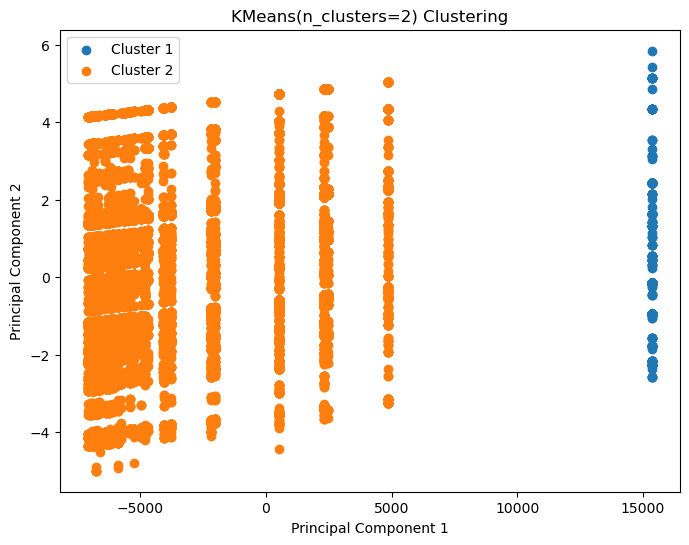

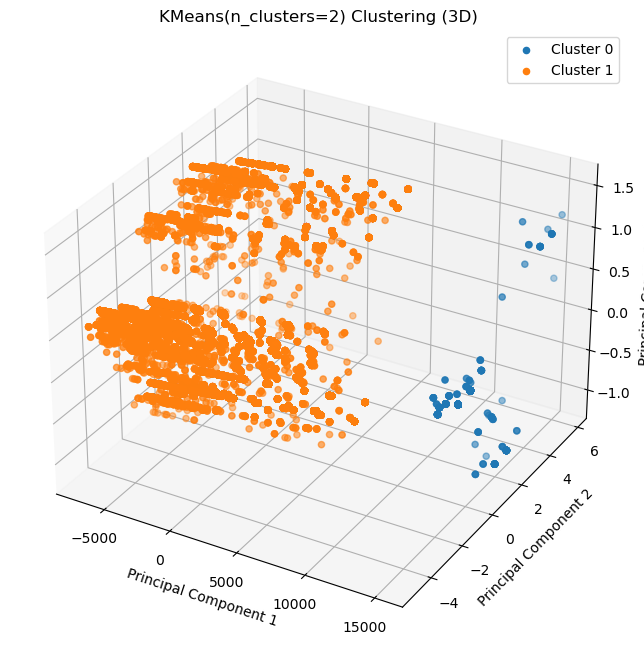

Silhouette Score: 0.8034477824112006
Davies-Bouldin Index: 0.1718627191336003
Calinski Score: 236171.45735183955


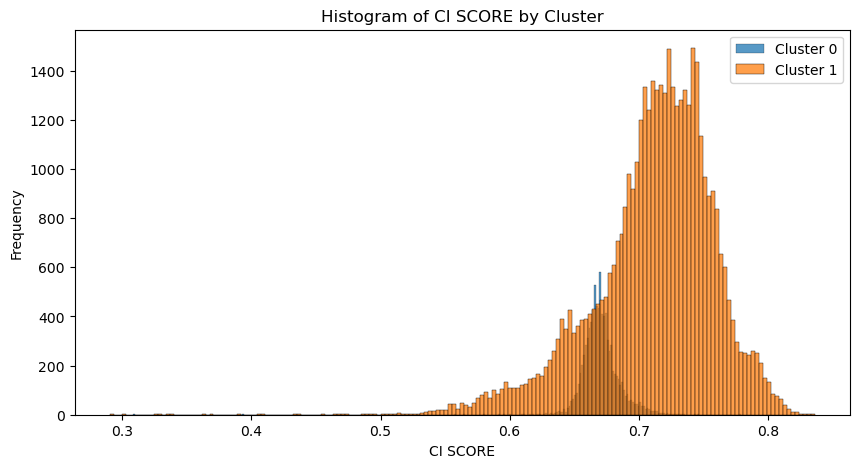

In [10]:
from sklearn.cluster import KMeans, BisectingKMeans, MiniBatchKMeans, Birch

df_cluster = clustering_data(
    x = ohe,
    model = KMeans(n_clusters = 2)
)

# Nested Clustering

In [11]:
df_cluster 

,index,Vulnerability Type(s),Vulnerability Name,Access,Complexity,Authentication,Conf.,Integ.,Avail,Score,Number Of Related Vulnerabilities,KMeans(n_clusters=2)
0,1,XSS,Failure to Preserve Web Page Structure ('Cross...,Remote,Medium,Not required,None,Partial,None,4.3,22413.0,0
1,2,Unknown,Improper Authentication,Remote,Low,Not required,Partial,Partial,Partial,7.5,3011.0,1
2,3,Unknown,URL Redirection to Untrusted Site ('Open Redir...,Remote,Medium,Not required,Partial,Partial,None,5.8,754.0,1
3,4,Unknown,Improper Input Validation,Remote,Low,Not required,None,Partial,None,5.0,9380.0,1
4,5,Unknown,Double Free,Local,Low,Not required,Partial,None,None,2.1,394.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
52629,61694,XSS,Failure to Preserve Web Page Structure ('Cross...,Remote,Medium,Not required,None,Partial,None,4.3,22413.0,0
52630,61695,DoS,Uncontrolled Resource Consumption ('Resource E...,Remote,Low,Not required,None,None,Partial,5.0,1320.0,1
52631,61696,Unknown,URL Redirection to Untrusted Site ('Open Redir...,Remote,Medium,Not required,Partial,Partial,None,5.8,754.0,1
52632,61697,XSS,Failure to Preserve Web Page Structure ('Cross...,Remote,Medium,Not required,None,Partial,None,4.3,22413.0,0


In [12]:
df_outlier = df_cluster[df_cluster['KMeans(n_clusters=2)']==1].reset_index().drop(columns=['level_0','KMeans(n_clusters=2)'])
df_outlier

,index,Vulnerability Type(s),Vulnerability Name,Access,Complexity,Authentication,Conf.,Integ.,Avail,Score,Number Of Related Vulnerabilities
0,2,Unknown,Improper Authentication,Remote,Low,Not required,Partial,Partial,Partial,7.5,3011.0
1,3,Unknown,URL Redirection to Untrusted Site ('Open Redir...,Remote,Medium,Not required,Partial,Partial,None,5.8,754.0
2,4,Unknown,Improper Input Validation,Remote,Low,Not required,None,Partial,None,5.0,9380.0
3,5,Unknown,Double Free,Local,Low,Not required,Partial,None,None,2.1,394.0
4,6,Unknown,Information Exposure Through an Error Message,Remote,Low,Not required,Partial,None,None,5.0,208.0
...,...,...,...,...,...,...,...,...,...,...,...
43813,61690,Unknown,Incorrect Default Permissions,Remote,Low,Unknown,None,Partial,None,4.0,802.0
43814,61691,DoS,Improper Resource Shutdown or Release,Remote,Medium,Not required,None,None,Partial,4.3,222.0
43815,61695,DoS,Uncontrolled Resource Consumption ('Resource E...,Remote,Low,Not required,None,None,Partial,5.0,1320.0
43816,61696,Unknown,URL Redirection to Untrusted Site ('Open Redir...,Remote,Medium,Not required,Partial,Partial,None,5.8,754.0


In [13]:
# df_outlier = df_cluster[df_cluster['KMeans(n_clusters=2)']==1]

#after features selection
cols = ['Access','Complexity','Authentication','Conf.','Integ.','Avail']
numerical_cols = ['Score','Number Of Related Vulnerabilities']

ohe_df_outlier = pd.concat([
    pd.get_dummies(df_outlier[cols],dtype=float),
    df_outlier[numerical_cols]
], axis=1).reset_index().drop(columns=['index'])


for col in cols:
    print(df_outlier[col].nunique(),'\t',df_outlier[col].unique())
    
print(ohe_df_outlier.shape)



3 	 ['Remote' 'Local' 'Local Network']
3 	 ['Low' 'Medium' 'High']
2 	 ['Not required' 'Unknown']
3 	 ['Partial' 'None' 'Complete']
3 	 ['Partial' 'None' 'Complete']
3 	 ['Partial' 'None' 'Complete']
(43818, 19)


In [14]:
ohe_df_outlier

,Access_Local,Access_Local Network,Access_Remote,Complexity_High,Complexity_Low,Complexity_Medium,Authentication_Not required,Authentication_Unknown,Conf._Complete,Conf._None,Conf._Partial,Integ._Complete,Integ._None,Integ._Partial,Avail_Complete,Avail_None,Avail_Partial,Score,Number Of Related Vulnerabilities
0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,7.5,3011.0
1,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,5.8,754.0
2,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,9380.0
3,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,2.1,394.0
4,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,5.0,208.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43813,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,4.0,802.0
43814,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.3,222.0
43815,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,5.0,1320.0
43816,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,5.8,754.0


In [15]:
# df_clusterr = clustering_data(
#     x = ohe_df_outlier,
#     model = KMeans(n_clusters = 2)
# )

x = ohe_df_outlier
model = KMeans(n_clusters = 2)
model.fit_predict(x)

print(np.unique(model.labels_))    
cluster_map = pd.DataFrame()
cluster_map['index_clustermap'] = range(1,len(x)+1)
cluster_map[f'{model}'] = model.labels_
cols = ['index','Vulnerability Type(s)','Vulnerability Name','Access','Complexity','Authentication','Conf.','Integ.','Avail'
       ,'Score','Number Of Related Vulnerabilities']
clustered_data = pd.concat([df_outlier[cols] , cluster_map[f'{model}']] , axis=1)
print(clustered_data[f'{model}'].value_counts())

C:\Users\pc\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



[0 1]
KMeans(n_clusters=2)
1    25971
0    17847
Name: count, dtype: int64


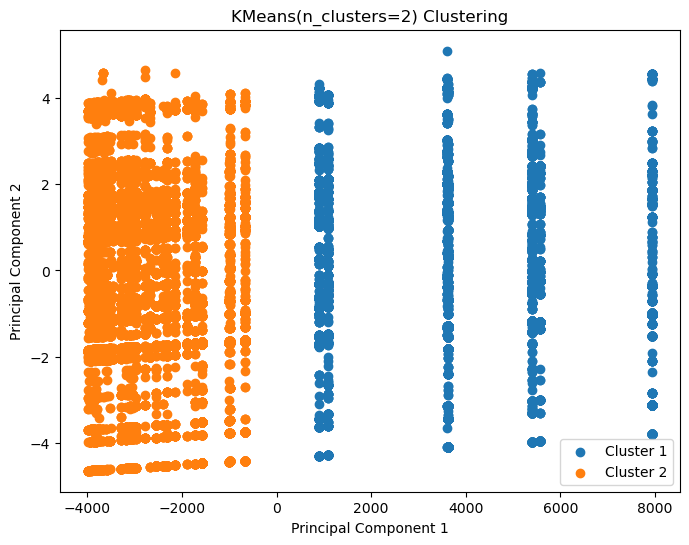

In [16]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt    

n_clusters = 2
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(x)

# Plotting the clusters
plt.figure(figsize=(8, 6))
for i in range(n_clusters):
    plt.scatter(reduced_data[clustered_data.iloc[:,-1] == i, 0], 
                    reduced_data[clustered_data.iloc[:,-1] == i, 1], label=f'Cluster {i+1}')
plt.title(f'{clustered_data.columns[-1]} Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

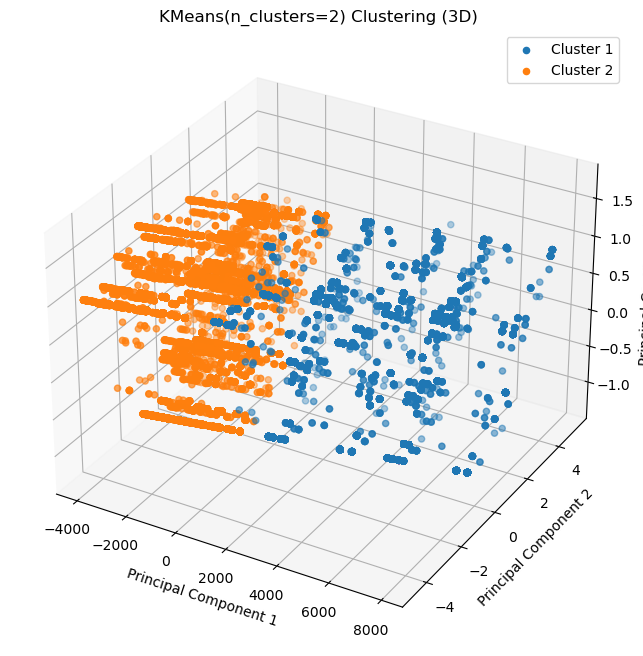

In [17]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

n_clusters = 2
pca = PCA(n_components=3)  # Change n_components to 3 for 3D data
reduced_data = pca.fit_transform(x)

# Plotting the clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for i in range(n_clusters):
    ax.scatter(reduced_data[clustered_data.iloc[:,-1] == i, 0], 
               reduced_data[clustered_data.iloc[:,-1] == i, 1],
               reduced_data[clustered_data.iloc[:,-1] == i, 2], label=f'Cluster {i+1}')

ax.set_title(f'{clustered_data.columns[-1]} Clustering (3D)')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.legend()
plt.show()


In [58]:

from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score

x = ohe_df_outlier
# Calculate the silhouette score (ranges from -1 to 1, higher is better)
silhouette_avg = silhouette_score(x, clustered_data.iloc[:,-1])
print("Silhouette Score:", silhouette_avg)

# Calculate the Davies-Bouldin index (lower is better)
davies_bouldin_avg = davies_bouldin_score(x, clustered_data.iloc[:,-1])
print("Davies-Bouldin Index:", davies_bouldin_avg)

# Calculate the Calinski ()
calinski_harabasz_score_avg = calinski_harabasz_score(x, clustered_data.iloc[:,-1])
print("Calinski Score:", calinski_harabasz_score_avg)

Silhouette Score: 0.7304882299048499
Davies-Bouldin Index: 0.379015568575869
Calinski Score: 198261.91384996392


In [90]:
clustered_data.shape , df.shape , pd.concat([clustered_data,df['CI SCORE']],axis=1,join='inner').shape

((43818, 12), (52634, 22), (43818, 13))

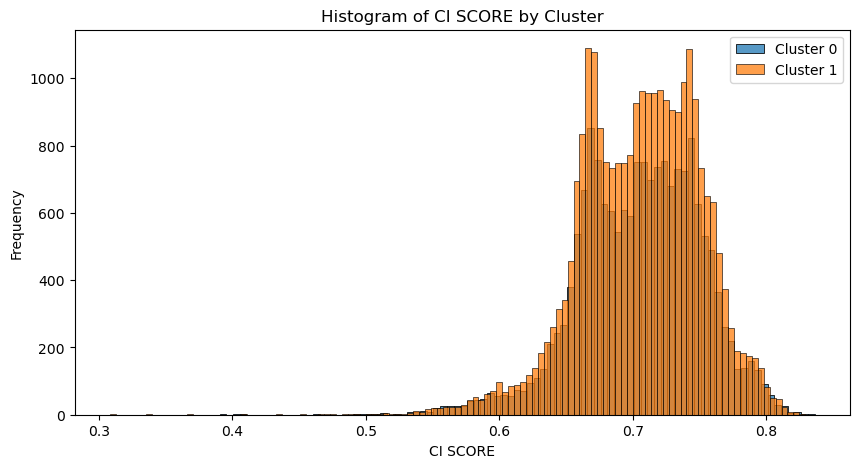

In [92]:
df1 = pd.concat([clustered_data,df['CI SCORE']],axis=1,join='inner')
# distribution for each cluster
cluster_0 = df1[df1[f'{model}']==0]
cluster_0_scores = cluster_0['CI SCORE']
cluster_1 = df1[df1[f'{model}']==1]
cluster_1_scores = cluster_1['CI SCORE']

plt.figure(figsize=(10,5))
sn.histplot(cluster_0_scores,label='Cluster 0')
sn.histplot(cluster_1_scores,label='Cluster 1')

plt.title('Histogram of CI SCORE by Cluster')
plt.xlabel('CI SCORE')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [20]:
from kmodes.kmodes import KModes


x = ohe_df_outlier
model = KModes(n_clusters = 2)
model.fit_predict(x)

print(np.unique(model.labels_))    
cluster_map = pd.DataFrame()
cluster_map['index_clustermap'] = range(1,len(x)+1)
cluster_map[f'{model}'] = model.labels_
cols = ['index','Vulnerability Type(s)','Vulnerability Name','Access','Complexity','Authentication','Conf.','Integ.','Avail'
       ,'Score','Number Of Related Vulnerabilities']
clustered_data = pd.concat([df_outlier[cols] , cluster_map[f'{model}']] , axis=1)
print(clustered_data[f'{model}'].value_counts())

[0 1]
KModes(n_clusters=2, n_init=1)
0    35081
1     8737
Name: count, dtype: int64


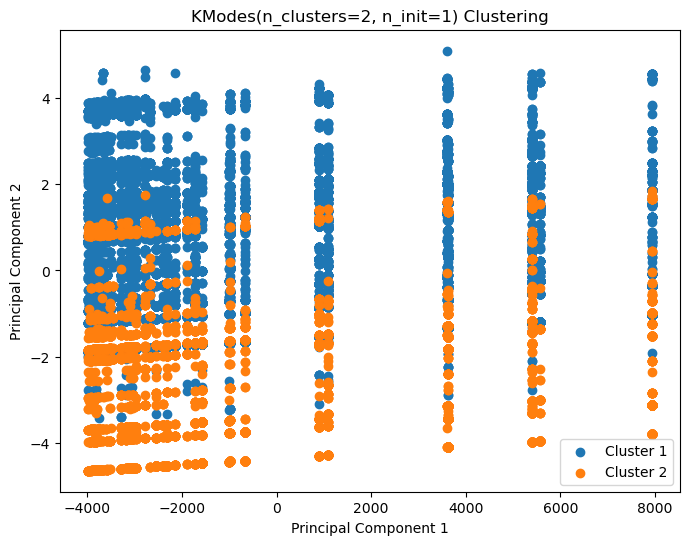

In [21]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt    

n_clusters = 2
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(x)

# Plotting the clusters
plt.figure(figsize=(8, 6))
for i in range(n_clusters):
    plt.scatter(reduced_data[clustered_data.iloc[:,-1] == i, 0], 
                    reduced_data[clustered_data.iloc[:,-1] == i, 1], label=f'Cluster {i+1}')
plt.title(f'{clustered_data.columns[-1]} Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

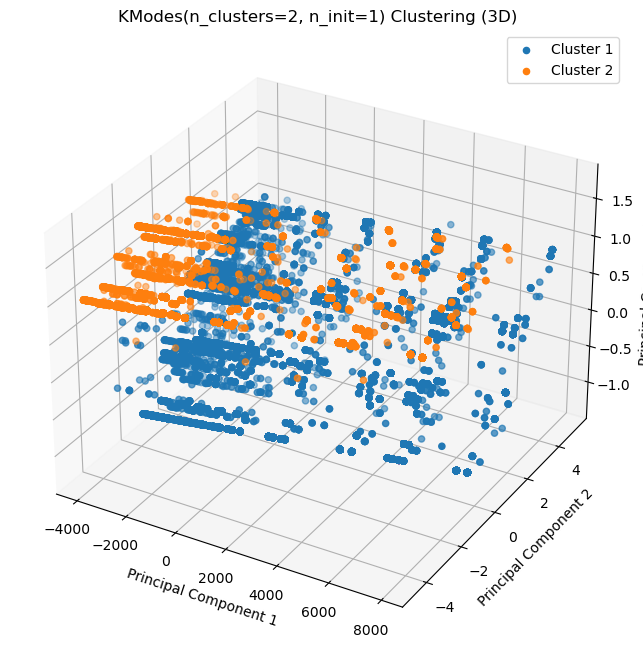

In [22]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

n_clusters = 2
pca = PCA(n_components=3)  # Change n_components to 3 for 3D data
reduced_data = pca.fit_transform(x)

# Plotting the clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for i in range(n_clusters):
    ax.scatter(reduced_data[clustered_data.iloc[:,-1] == i, 0], 
               reduced_data[clustered_data.iloc[:,-1] == i, 1],
               reduced_data[clustered_data.iloc[:,-1] == i, 2], label=f'Cluster {i+1}')

ax.set_title(f'{clustered_data.columns[-1]} Clustering (3D)')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.legend()
plt.show()


In [23]:
import plotly.graph_objects as go
from sklearn.decomposition import PCA

n_clusters = 2
pca = PCA(n_components=3)
reduced_data = pca.fit_transform(x)
# Create a trace for each cluster
dataa = []
for i in range(n_clusters):
    trace = go.Scatter3d(
        x=reduced_data[clustered_data.iloc[:,-1] == i, 0],
        y=reduced_data[clustered_data.iloc[:,-1] == i, 1],
        z=reduced_data[clustered_data.iloc[:,-1] == i, 2],
        mode='markers',
        name=f'Cluster {i}',
        marker=dict(size=5)
    )
    dataa.append(trace)
# Create the layout for the plot
layout = go.Layout(
    title=f'{clustered_data.columns[-1]} Clustering (3D)',
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3',
    )
)
# Create the figure and plot it
fig = go.Figure(data=dataa, layout=layout)
fig.show()

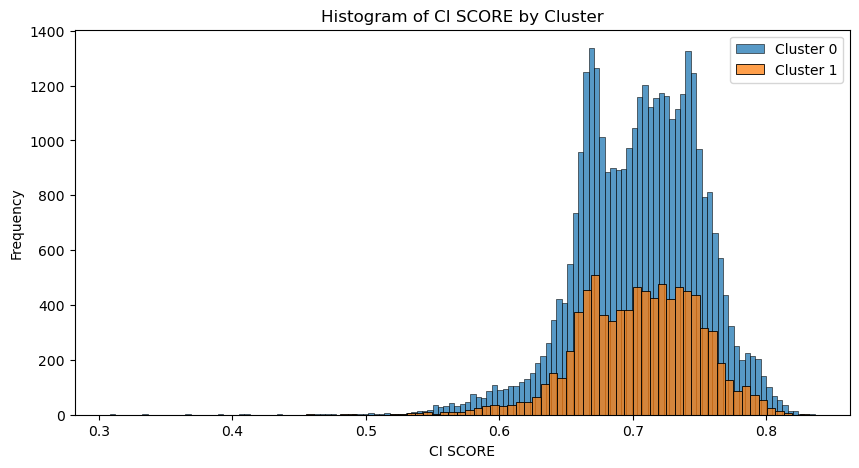

In [113]:
df1 = pd.concat([clustered_data,df['CI SCORE']],axis=1,join='inner')
# distribution for each cluster
cluster_0 = df1[df1[f'{model}']==0]
cluster_0_scores = cluster_0['CI SCORE']
cluster_1 = df1[df1[f'{model}']==1]
cluster_1_scores = cluster_1['CI SCORE']

plt.figure(figsize=(10,5))
sn.histplot(cluster_0_scores,label='Cluster 0')
sn.histplot(cluster_1_scores,label='Cluster 1')

plt.title('Histogram of CI SCORE by Cluster')
plt.xlabel('CI SCORE')
plt.ylabel('Frequency')
plt.legend()
plt.show()
